In [1]:
from scipy.integrate import odeint, solve_ivp
import numpy as np
from numpy.random import default_rng
import plotly.graph_objects as go
import plotly.io as pio
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import plotly.figure_factory as ff
import plotly.offline as py
import sys

# Initialize Variables

In [45]:
### initialize given values
covariance_v_t0 = 200**2  # (ft/sec)^2
Vc = 300.0 # ft/sec
covariance_at = 100**2    # (ft/sec^2)^2
tf = 10.0 # sec
R1 = 15.0e-6 # rad^2/sec
R2 = 1.67e-3 # rad^2/sec^3
tau = 2.0 # sec
npts = 10001
timevec = np.linspace(0, tf, npts)
dt = timevec[1] - timevec[0]

### initialize provided matrices in the dynamic equations
F = np.array([
    [0, 1, 0],
    [0, 0, -1],
    [0, 0, -1/tau]
])
G = np.array([0, 0, 1])
W = np.array([
    [0, 0, 0],
    [0, 0, 0],
    [0, 0, covariance_at]
])
H_bar = np.array([[1, 0, 0]])
P0 = np.array([
    [0, 0, 0],
    [0, covariance_v_t0, 0],
    [0, 0, covariance_at]
])
xhat0 = np.array([0, 0, 0])

# initialize the random noise generator
rng = default_rng()

# Calculate A Priori Covariance and Kalman Gains

In [46]:
# print(timevec.shape)
Pt = np.zeros((3,3,npts))
Pt[:,:,0] = P0
# print(Pt[:,:,0])
for i in range(npts-1):
    Pdot = F.dot(Pt[:,:,i]) + Pt[:,:,i].dot(F.T) - 1 / (Vc**2 * R1 * (tf - timevec[i])**2 + Vc**2 * R2) * Pt[:,:,i].dot(H_bar.T).dot(H_bar).dot(Pt[:,:,i]) + W
    Pt[:,:,i+1] = Pt[:,:,i] + Pdot * dt

# reconstruct K1, K2, and K3 from the covariance
K1 = np.array([Pt[0,0,i] / (Vc * R1 * (tf) + Vc * R2 / (tf - timevec[i])) for i in range(npts-1)])
K2 = np.array([Pt[0,1,i] / (Vc * R1 * (tf) + Vc * R2 / (tf - timevec[i])) for i in range(npts-1)])
K3 = np.array([Pt[0,2,i] / (Vc * R1 * (tf) + Vc * R2 / (tf - timevec[i])) for i in range(npts-1)])

# reconstruct the standard deviation of each state error from the covariance
std_pos = [np.sqrt(Pt[0,0,i]) for i in range(npts)]
std_vel = [np.sqrt(Pt[1,1,i]) for i in range(npts)]
std_accel = [np.sqrt(Pt[2,2,i]) for i in range(npts)]

# Key Simulation Functions
This section includes functions to evolve the state dynamics that run the simulation

In [47]:
def statespace(t, x, w_i):
    xdot = F.dot(x) + G.dot(w_i)
    return x + xdot*dt

def evolveTrueState(t, x0, w):
    # Inputs:
    # - t: the time vector as a numpy array with shape (n, )
    # - x0: the initial state vector corresponding to the time value at index 0 in t. A numpy array with shape (m,)
    m = x0.shape[0]
    n = t.shape[0]
    x = np.zeros((m, n))
    x[:,0] = x0
    for i in range(n-1):
        x[:,i+1] = statespace(t[i], x[:,i], w[i])
    return x

# Kalman Filter Function

In [62]:
def kalmanFilter(t, Pt, x0, z, K1, K2, K3):
    # this function propagates the dynamics of the Kalman Filter
    # inputs:
    # - t: a float representing the current time
    # - xhat_and_P: a numpy array with shape (3, 4) where the elements in the first column (:,0) 
    #               represent the state estimation and the elements in the remaining three columns 
    #               represent the covariance associated with the state estimate
    m = x0.shape[0]
    n = t.shape[0]
    xhat = np.zeros((m, n))
    z_i = np.searchsorted(timevec, t, side='right') - 1
    residuals = np.zeros(n)
    
    for i in range(n-1):
        # belief state in theta (the LOS angle)
        thetahat = xhat[0,i] / (Vc*(tf - t[i]))

        # residual
        residual = z[i] - thetahat # yhatdot = vhat + K_n (z - thetahat)
        residuals[i] = residual

        # CT equations for the belief state
        xhatdot = np.zeros(3)
        xhatdot[0] = xhat[1,i] + K1[i] * residual
        xhatdot[1] = -xhat[2,i] + K2[i] * residual
        xhatdot[2] = -xhat[2,i]/tau + K3[i] * residual
        
        # calculate the next belief state
        xhat[:,i+1] = xhat[:,i] + xhatdot * dt
    
    return xhat, residuals

# Simulation Function with Gauss-Markov Noise

In [99]:
def sim_run():
    # initialize the state for this run
    y0 = 0
    v0 = rng.normal(scale=np.sqrt(covariance_v_t0)) # std is 200 ft/sec
    aT0 = rng.normal(scale=np.sqrt(covariance_at))
    x0 = np.array([0, v0, aT0])

    # generate the noise
    w = rng.normal(scale=np.sqrt(covariance_at/dt), size=npts) 
    # simulate the true state
    x = evolveTrueState(timevec, x0, w)
    # calculate the true LOS angle for this run
    theta = np.array([x[0,i] / (Vc *(tf - timevec[i])) for i in range(npts-1)]) # up to n-1 to avoid divide by zero
    # generate the sensor measurement noise
    eta = np.array([rng.normal(scale=np.sqrt((R1 + R2/(tf - timevec[i])**2)/dt)) for i in range(npts-1)]) # up to n-1 to match theta
    # generate the sensor measurment by ading the noise to the true LOS angle
    z = theta + eta
    # run the CT Kalman Filter to produce state estimates and covariance over time
    xhat, residuals = kalmanFilter(timevec, Pt, x0, z, K1, K2, K3)

    return x, xhat, residuals, theta, z

In [100]:
# sol, filtersol, theta, z = sim_run()
x, xhat, res, theta, z = sim_run()

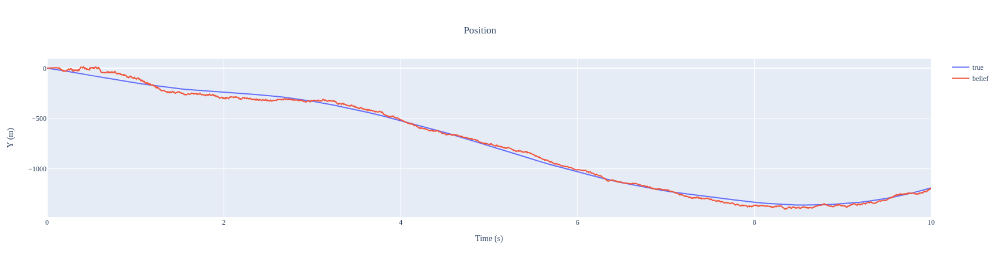

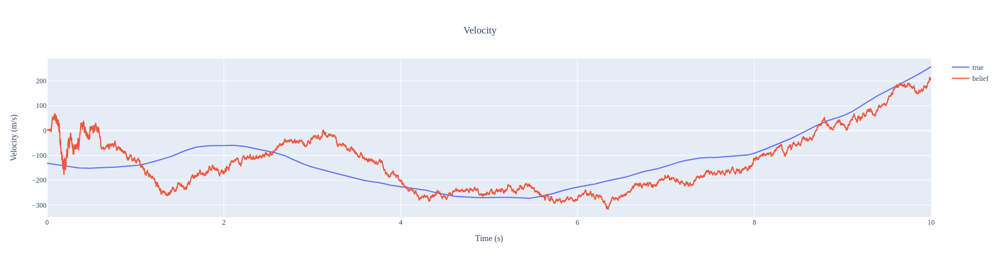

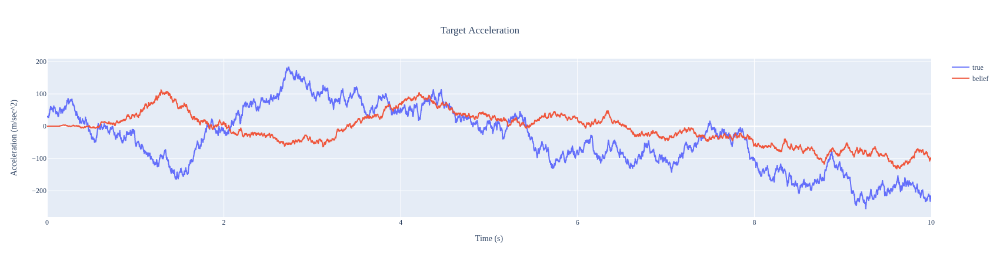

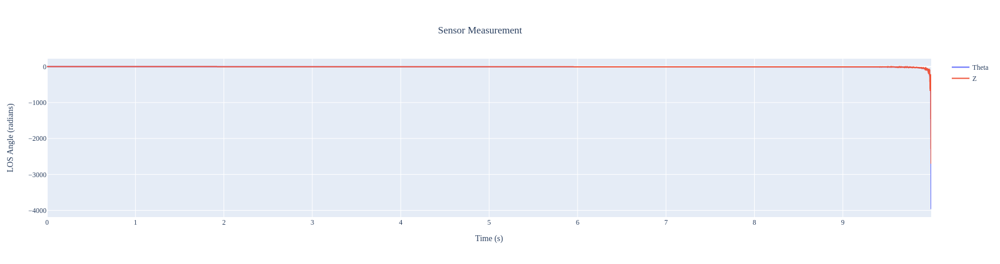

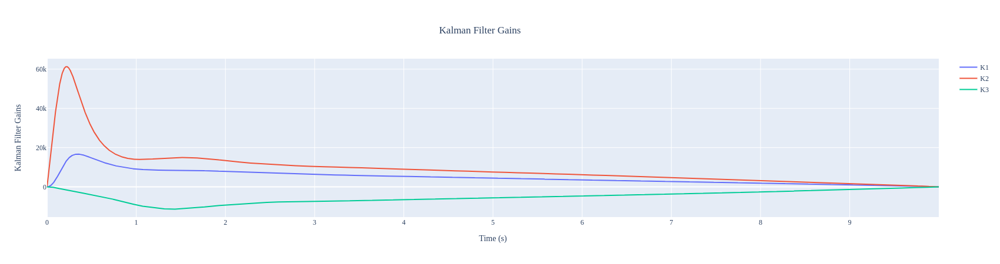

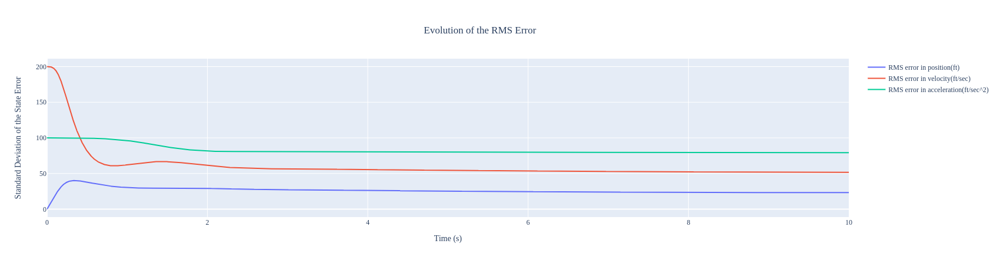

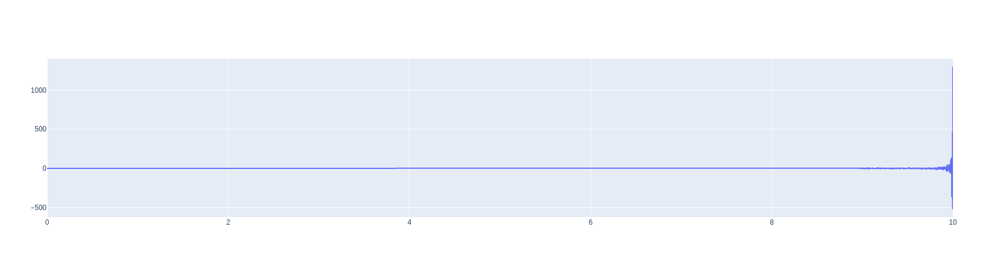

In [101]:
myfont = "Times New Roman"

# Position
figy = go.Figure()
figy.add_trace(go.Scatter(x=timevec, y=x[0,:], name="true"))
figy.add_trace(go.Scatter(x=timevec[0:-1], y=xhat[0,:], name="belief"))
figy.update_layout(font = dict(family=myfont), title={'text':"Position",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="Y (m)")
figy.show()

# Velocity
figv = go.Figure()
figv.add_trace(go.Scatter(x=timevec, y=x[1,:], name='true'))
figv.add_trace(go.Scatter(x=timevec[0:-1], y=xhat[1,:], name='belief'))
figv.update_layout(font = dict(family=myfont), title={'text':"Velocity",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="Velocity (m/s)")
figv.show()

# # Acceleration
figat = go.Figure()
figat.add_trace(go.Scatter(x=timevec, y=x[2,:], name='true'))
figat.add_trace(go.Scatter(x=timevec[0:-1], y=xhat[2,:], name='belief'))
figat.update_layout(font = dict(family=myfont), title={'text':"Target Acceleration",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="Acceleration (m/sec^2)")
figat.show()

# # Theta
figtheta = go.Figure()
figtheta.add_trace(go.Scatter(x=timevec[0:-1], y=theta, name='Theta'))
figtheta.add_trace(go.Scatter(x=timevec[0:-1], y=z, name='Z'))
figtheta.update_layout(font = dict(family=myfont), title={'text':"Sensor Measurement",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="LOS Angle (radians)")
figtheta.show()

# Kalman Gains
figk = go.Figure()
figk.add_trace(go.Scatter(x=timevec[0:-1], y=K1, name='K1'))
figk.add_trace(go.Scatter(x=timevec[0:-1], y=K2, name='K2'))
figk.add_trace(go.Scatter(x=timevec[0:-1], y=K3, name='K3'))
figk.update_layout(font = dict(family=myfont), title={'text':"Kalman Filter Gains",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="Kalman Filter Gains")
figk.show()

# RMS Error
figp = go.Figure()
figp.add_trace(go.Scatter(x=timevec, y=std_pos, name='RMS error in position(ft)'))
figp.add_trace(go.Scatter(x=timevec, y=std_vel, name='RMS error in velocity(ft/sec)'))
figp.add_trace(go.Scatter(x=timevec, y=std_accel, name='RMS error in acceleration(ft/sec^2)'))
figp.update_layout(font = dict(family=myfont), title={'text':"Evolution of the RMS Error",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = { 'title' : {'text' : "Time (s)", 'font' : { 'family' : myfont } } } , yaxis_title="Standard Deviation of the State Error")
figp.show()

# Residual
figr = go.Figure()
figr.add_trace(go.Scatter(x=timevec, y=res, name='Residual'))
figr.show()

# Perform the Monte Carlo run

In [103]:
### Perform the Monte Carlo simulation
runs = 100     # this value sets the number of iterations in the MC run

# variables to store error, RMSE, and residuals
error_actual = np.zeros((runs,3,npts))
rmse = np.zeros((3, npts))
residuals_mc = np.zeros((runs, npts))

# perform the MC iterations
for j in range(runs):
    mc_x, mc_xhat, residuals, __, __ = sim_run()
    residuals_mc[j,:] = residuals
    error_actual[j,:,:] = mc_x - mc_xhat
    rmse[:,:] += np.square(error_actual[j,:,:])
    sys.stdout.write("\rCount: %i" % j)
    sys.stdout.flush()
    
# calculate average errors, RMSE, and residuals
avg_error = np.average(error_actual, axis=0)
rmse /= runs
rmse = np.sqrt(rmse)
residuals_avg = np.average(residuals_mc, axis=0)

Count: 99

# Save Monte Carlo run data

In [80]:
savesuffix='2.27.2021_17h.29m'
np.save('rmse_' + savesuffix, rmse)
np.save('avg_error_' + savesuffix, avg_error)
np.save('residuals_avg_' + savesuffix, residuals_avg)
np.save('residuals_mc' + savesuffix, residuals_mc)

# Load Monte Carlo run data

In [105]:
loadsuffix='2.27.2021_16h.29m'
rmse = np.load('rmse_' + loadsuffix + '.npy')
avg_error = np.load('avg_error_' + loadsuffix + '.npy')
residuals_avg = np.load('residuals_avg_' + loadsuffix + '.npy')
residuals_mc = np.load('residuals_mc' + loadsuffix + '.npy')

# Plot Monte Carlo Run Data

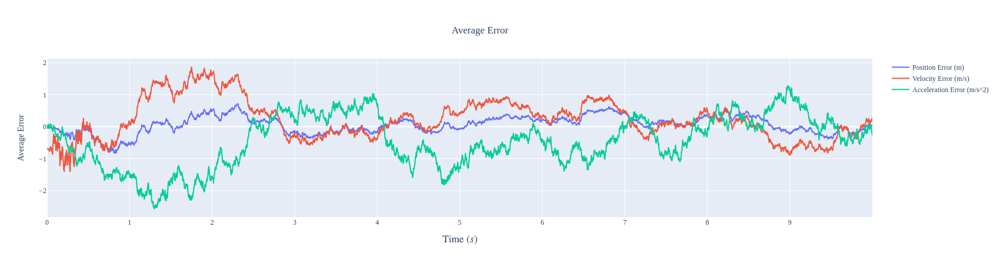

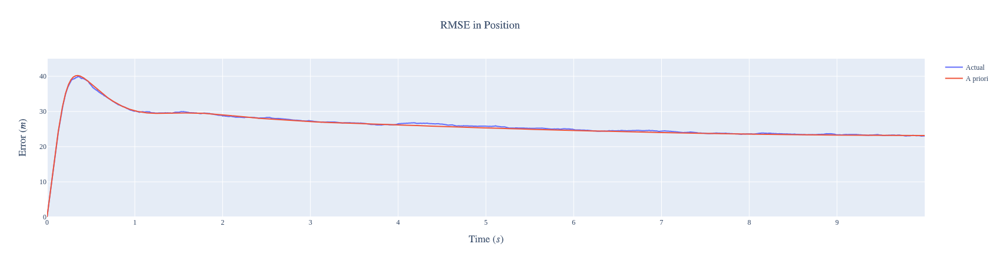

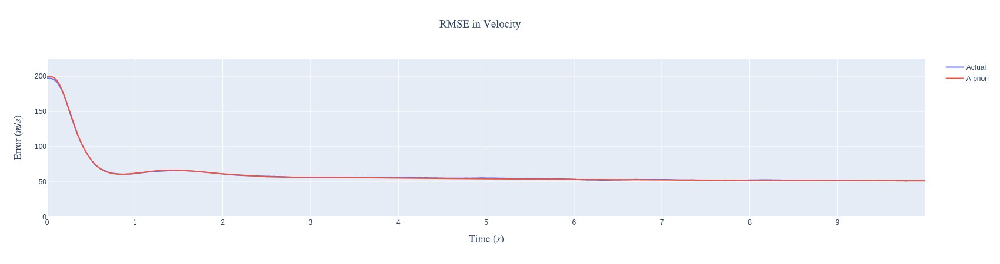

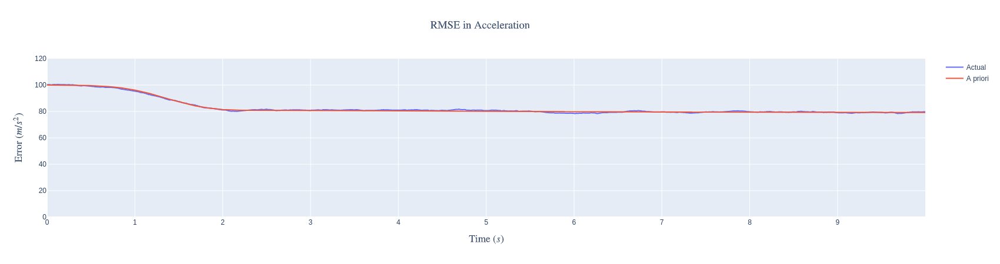

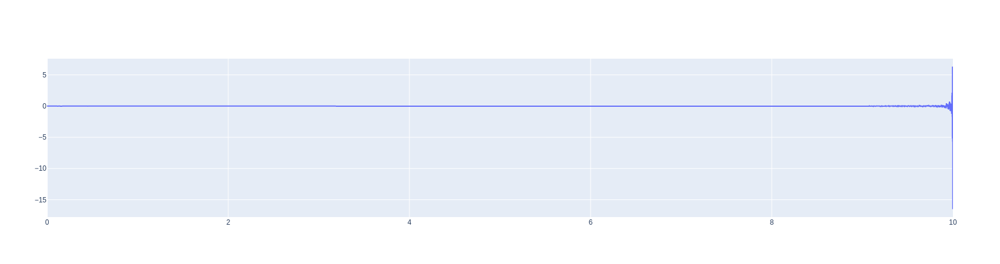

The ensemble average for correlation of the residuals is: 0.09397568100982863


In [106]:
endindex = npts-1
myfont = "Times New Roman"

# Average error
fig_avg_error = go.Figure()
fig_avg_error.add_trace(go.Scatter(x=timevec[0:endindex], y=avg_error[0,:], name="Position Error (m)"))
fig_avg_error.add_trace(go.Scatter(x=timevec[0:endindex], y=avg_error[1,:], name="Velocity Error (m/s)"))
fig_avg_error.add_trace(go.Scatter(x=timevec[0:endindex], y=avg_error[2,:], name="Acceleration Error (m/s^2)"))
fig_avg_error.update_layout(font = {'family' : myfont}, title={'font': {'family': myfont}, 'text':"Average Error",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = dict( title = dict (text=r"$\text{Time (} s \text{)}$", font = dict(family = myfont))), yaxis_title="Average Error")
fig_avg_error.show()

# RMSE in position
fig_rmse_pos = go.Figure()
fig_rmse_pos.add_trace(go.Scatter(x=timevec[0:endindex], y=rmse[0,:], name="Actual"))
# fig_rmse_pos.add_trace(go.Scatter(x=timevec[0:endindex], y=np.sqrt(P_actual[0,0,:]), name="Actual"))
fig_rmse_pos.add_trace(go.Scatter(x=timevec[0:endindex], y=std_pos[0:endindex], name='A priori'))
fig_rmse_pos.update_layout(font = {'family' : myfont}, title={'font': {'family': myfont}, 'text':r"$\text{RMSE in Position}$",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis = dict( title = dict (text=r"$\text{Time (} s \text{)}$", font = dict(family = myfont))), yaxis_title=r"$\text{Error (}m \text{)}$)", yaxis = dict( range = [0, 45] ))
fig_rmse_pos.show()

# RMSE in velocity
fig_rmse_vel = go.Figure()
fig_rmse_vel.add_trace(go.Scatter(x=timevec[0:endindex], y=rmse[1,:], name="Actual"))
fig_rmse_vel.add_trace(go.Scatter(x=timevec[0:endindex], y=std_vel[0:endindex], name='A priori'))
fig_rmse_vel.update_layout(title={'text':r"$\text{RMSE in Velocity}$",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis_title=r"$\text{Time (} s \text{)}$", yaxis_title=r"$\text{Error (}m/s \text{)}$)", yaxis = dict(range=[0,225]))
fig_rmse_vel.show()

# RMSE in acceleration
fig_rmse_accel = go.Figure()
fig_rmse_accel.add_trace(go.Scatter(x=timevec[0:endindex], y=rmse[2,:], name="Actual"))
fig_rmse_accel.add_trace(go.Scatter(x=timevec[0:endindex], y=std_accel[0:endindex], name='A priori'))
fig_rmse_accel.update_layout(title={'text':r"$\text{RMSE in Acceleration}$",'xanchor':'center','yanchor':'top','y':0.9,'x':0.48}, xaxis_title=r"$\text{Time (} s \text{)}$", yaxis_title=r"$\text{Error (}m/s^2 \text{)}$)", yaxis = dict(range=[0,120]))
fig_rmse_accel.show()

# Plot residuals
fig_res = go.Figure()
fig_res.add_trace(go.Scatter(x=timevec, y=residuals_avg))
fig_res.show()

# Print out the residual correlation
k = int(npts/2)
j = int(3*npts/4)
residual_correlation = residuals_mc[:,k].dot(residuals_mc[:,j]) / runs
print("The ensemble average for correlation of the residuals is: " + str(residual_correlation) )